# Typical SSOF analysis example using a previously fit SSOF model

## Importing packages

In [1]:
using Pkg
Pkg.activate(".")
Pkg.instantiate()

import StellarSpectraObservationFitting as SSOF

using JLD2  # importing saved model
using Plots  # plotting
using Statistics  # mean function

# approximating PDF of saved model scores
using KernelDensity  # Bandwidth calculation
using Distributions  # Normal distribution
using StatsBase  # sample function

include("../SSOFUtilities/plots.jl")  # some plotting functions
_plot(; dpi = 100, size = (960, 540), thickness_scaling=1., margin=4Plots.mm, kwargs...) =
    plot(; dpi=dpi, size=size, thickness_scaling=thickness_scaling, margin=margin, kwargs...)

  Activating project at `C:\Users\Christian\Dropbox\GP_research\julia\StellarSpectraObservationFitting\examples`


_plot (generic function with 1 method)

## Simulating data

### Loading in model and data

In [2]:
# load in a prefit SSOF model and the data that it was fit to
@load "jld2/results.jld2" model
@load "jld2/data.jld2" data  # only used for LSF and blaze function

1-element Vector{Symbol}:
 :data

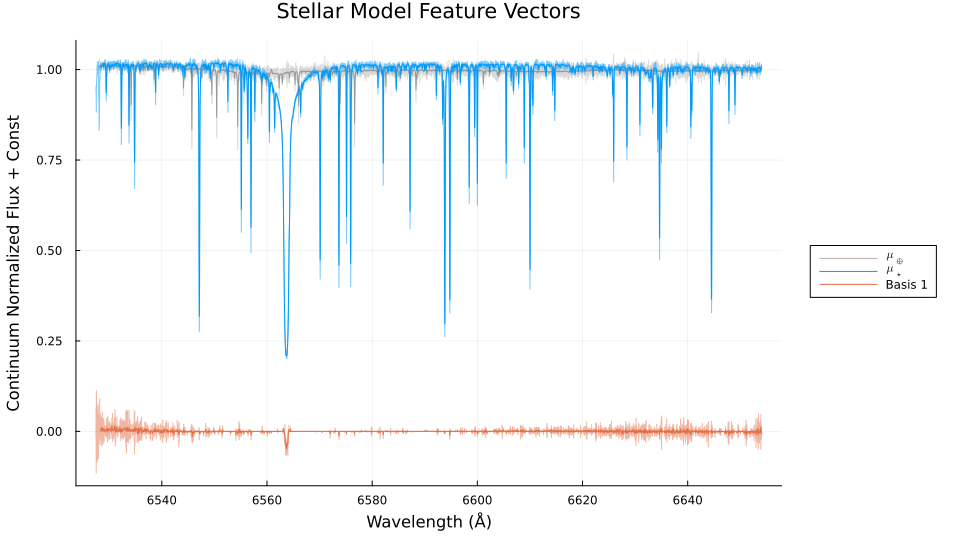

In [3]:
stellar=true
plot_bases(model, data, stellar)

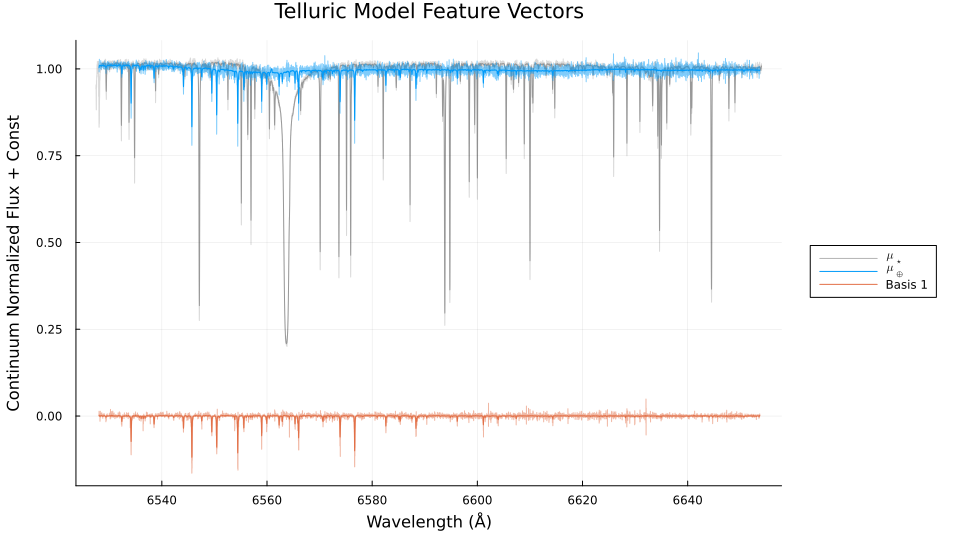

In [4]:
stellar=false
plot_bases(model, data, stellar)

### Making simulated stellar data

#### Setting number of observations, injected RVs, and desired SNR at center of order

In [5]:
# how many observations we want
n_simulated_observations = 50

# Adding whatever additional RVs we want
injected_rvs = zeros(n_simulated_observations)
# K = 10  # planet velocity semi-amplitude (m/s)
# P = 60  # planet period (d)
# injected_rvs = K .* sin(times ./ P * 2 * π)

# simulated central pixel SNR
desired_max_snr = 500;

#### Barycentric RVs
One could use barycorrpy to get realistic barycentric correction RVs (the code shown gets observations of HD 26965 from Kitt Peak) but we can also use a simpler epicyclic model

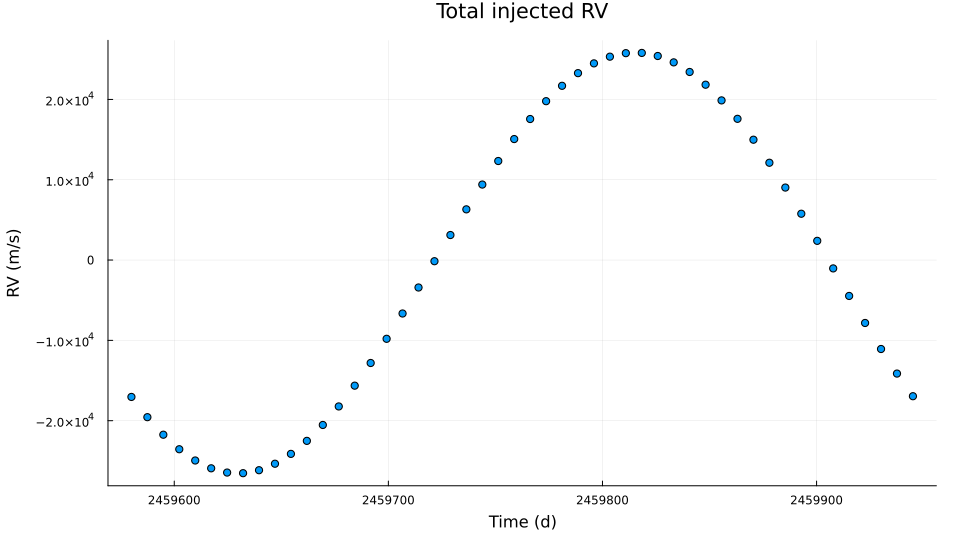

In [6]:
# spread observations evenly across all of 2022 (JD)
times = 2459580 .+ collect(LinRange(365., 0, n_simulated_observations));

# # Barycorrpy version
# using PyCall
# barycorrpy = PyNULL()
# # pyimport_conda("scipy", "scipy")
# # pushfirst!(PyVector(pyimport("sys")."path"), @__DIR__)
# copy!(barycorrpy , pyimport("barycorrpy") )
# barycentric_corrections = barycorrpy.get_BC_vel(JDUTC=times, hip_id=19849, obsname="KPNO", ephemeris="de430")
# barycentric_rvs = barycentric_corrections[1]

# Epicyclic approximation for simplicity (correct within 411 m/s)
year = 365.25
phases = times ./ year * 2 * π
design_matrix = hcat(cos.(phases), sin.(phases), cos.(2 .* phases), sin.(2 .* phases), ones(length(times)))
epicyclic_barycentric_rv_coefficients = [-20906.74122340397, -15770.355782489662, -390.29975114321905, -198.97407208182858, -67.99370656806558]
barycentric_rvs = design_matrix * epicyclic_barycentric_rv_coefficients

# observed wavelengths will just be the same as the original model
# could downsample here
log_λ_obs = model.tel.log_λ * (ones(n_simulated_observations)')
log_λ_stellar = log_λ_obs .+ (SSOF.rv_to_D(barycentric_rvs)')

plot_rv()
scatter!(times, barycentric_rvs + injected_rvs; label="", title="Total injected RV")

#### Sampling some typical stellar model scores

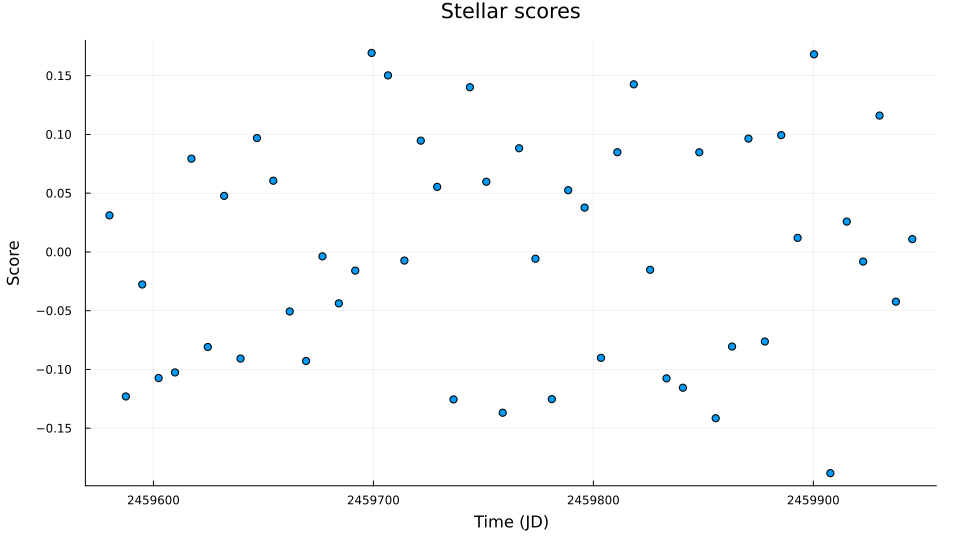

In [7]:
# getting stellar feature score values that roughly match the original modeled distribution
bandwidth_stellar = KernelDensity.default_bandwidth(vec(model.star.lm.s))
model_scores_stellar = rand.(Normal.(sample(vec(model.star.lm.s), n_simulated_observations; replace=true), bandwidth_stellar))'
model_scores_stellar .-= mean(model_scores_stellar)
plot_scores()
scatter!(times, model_scores_stellar'; label="", ylabel="Score", xlabel="Time (JD)", title="Stellar scores")

#### Evaluating the linear model and interpolating the simulated flux to the observed wavelengths

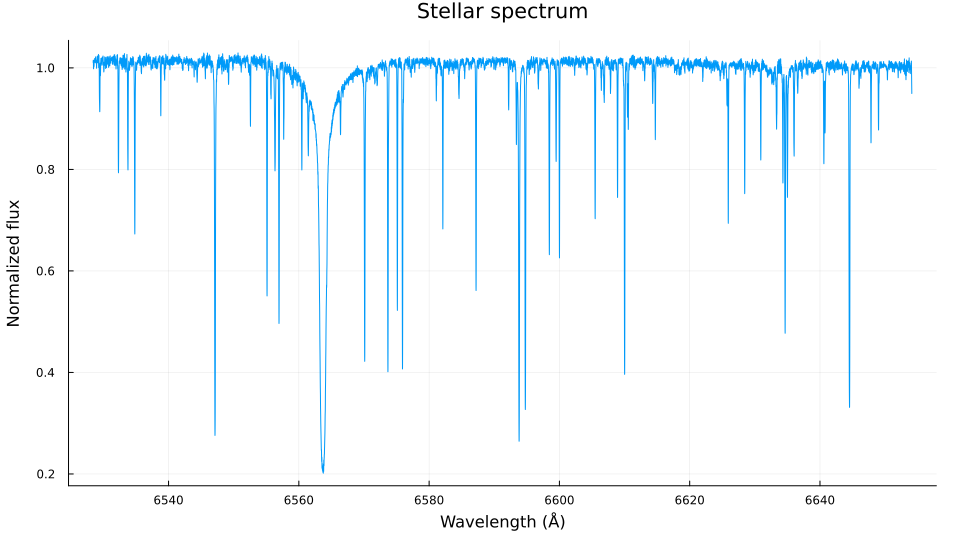

In [8]:
# evaluating linear model
_flux_stellar = SSOF._eval_lm(model.star.lm.M, model_scores_stellar, model.star.lm.μ; log_lm=model.star.lm.log)  # replace s for custom data

# interpolating stellar flux
b2o = SSOF.StellarInterpolationHelper(model.star.log_λ, injected_rvs + barycentric_rvs, log_λ_obs)
flux_stellar = SSOF.spectra_interp(_flux_stellar, injected_rvs + barycentric_rvs, b2o)

# plotting the first simulated stellar spectra
plot_spectrum()
plot!(exp.(log_λ_stellar[:, 1]), flux_stellar[:, 1]; label="", ylabel="Normalized flux", xlabel="Wavelength (Å)", title="Stellar spectrum")

### Making simulated telluric data

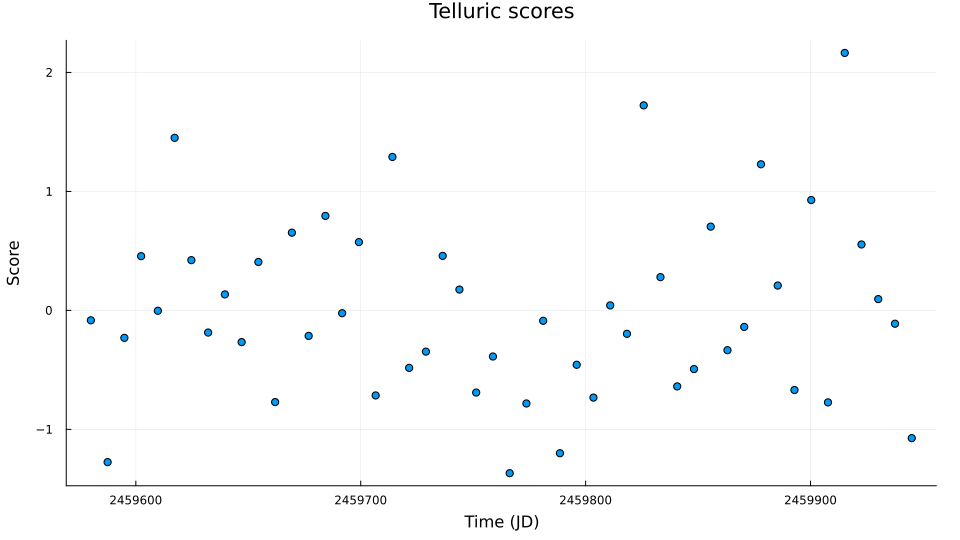

In [9]:
# getting telluric feature score values that roughly match the original modeled distribution
bandwidth_telluric = KernelDensity.default_bandwidth(vec(model.tel.lm.s))
model_scores_telluric = rand.(Normal.(sample(vec(model.tel.lm.s), n_simulated_observations; replace=true), bandwidth_telluric))'
model_scores_telluric .-= mean(model_scores_telluric)
plot_scores()
scatter!(times, model_scores_telluric'; label="", ylabel="Score", xlabel="Time (JD)", title="Telluric scores")

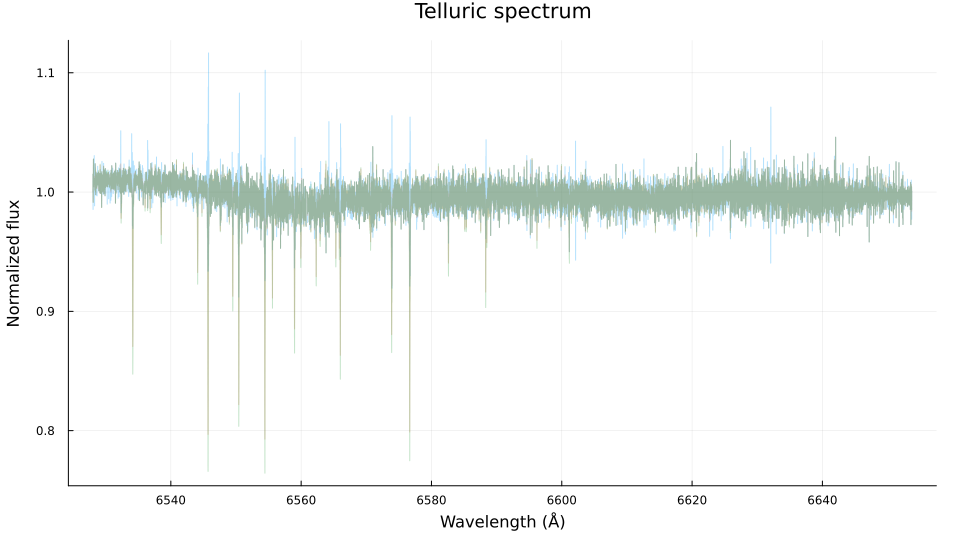

In [10]:
# simulated telluric transmission
flux_tellurics = SSOF._eval_lm(model.tel.lm.M, model_scores_telluric, model.tel.lm.μ; log_lm=model.tel.lm.log)

# plotting the first couple simulated telluric spectra
plot_spectrum()
plot!(exp.(log_λ_obs[:, 1:3]), flux_tellurics[:, 1:3]; label="", ylabel="Normalized flux", title="Telluric spectrum", alpha=0.3)

### Combining stellar and telluric models

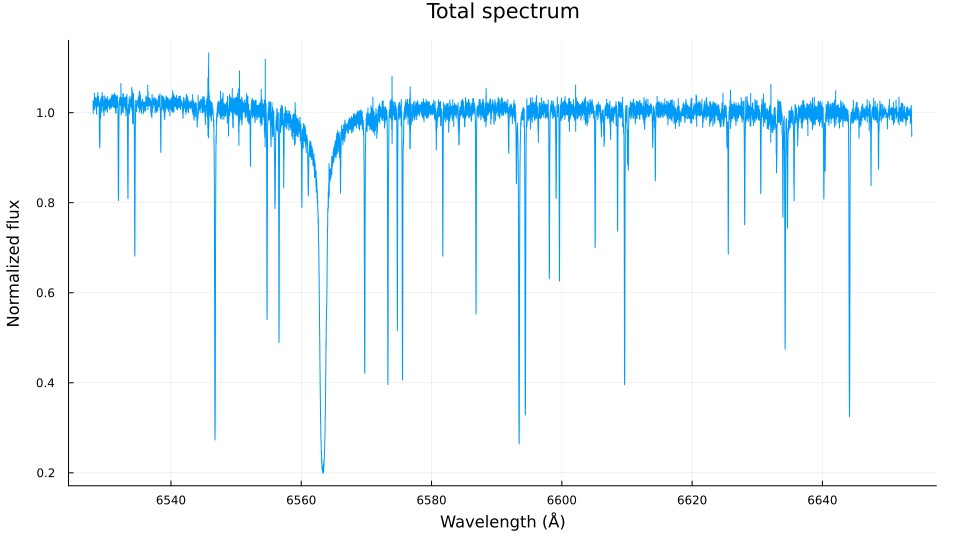

In [11]:
flux_total = SSOF.total_model(flux_tellurics, flux_stellar)

# plotting the first simulated combined spectra
plot_spectrum()
plot!(exp.(log_λ_obs[:, 1]), flux_total[:, 1]; label="", ylabel="Normalized flux", title="Total spectrum")

#### Getting a realistic LSF

In [12]:
## getting a realistic LSF
include("../NEID/lsf.jl")  # defines NEIDLSF.NEID_lsf()
lsf_simulated = NEIDLSF.neid_lsf(81, vec(mean(data.log_λ_obs; dims=2)), vec(mean(log_λ_obs; dims=2)))
# heatmap(Matrix(lsf_simulated[1:50, 1:50]))

13299×13299 SparseArrays.SparseMatrixCSC{Float64, Int64} with 205332 stored entries:
⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀⠀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦⡀⠀
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠈⠻⣦

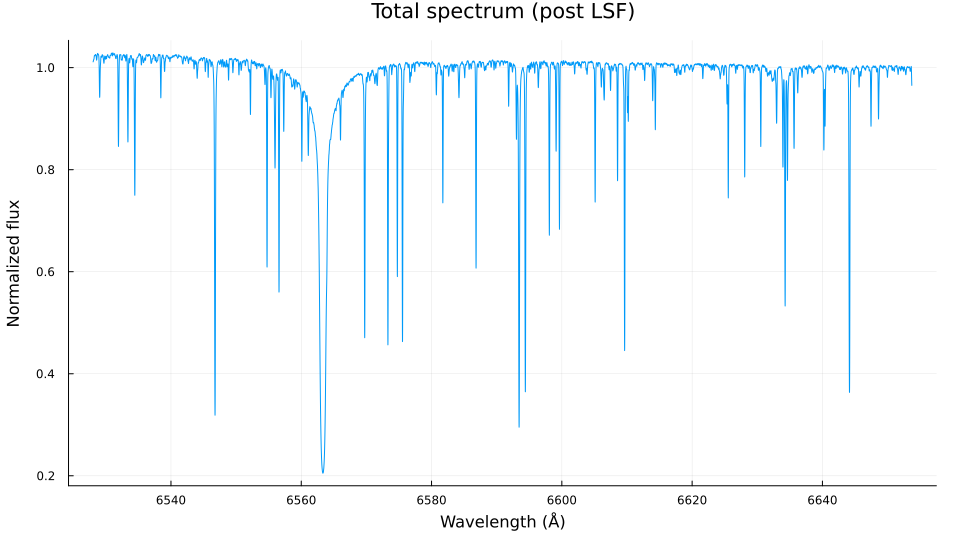

In [13]:
flux_total_lsf = lsf_simulated * flux_total

# plotting the first simulated combined spectra (post-LSF)
plot_spectrum()
plot!(exp.(log_λ_obs[:, 1]), flux_total_lsf[:, 1]; label="", ylabel="Normalized flux", title="Total spectrum (post LSF)")

#### Getting a realistic blaze function (for variance scaling)

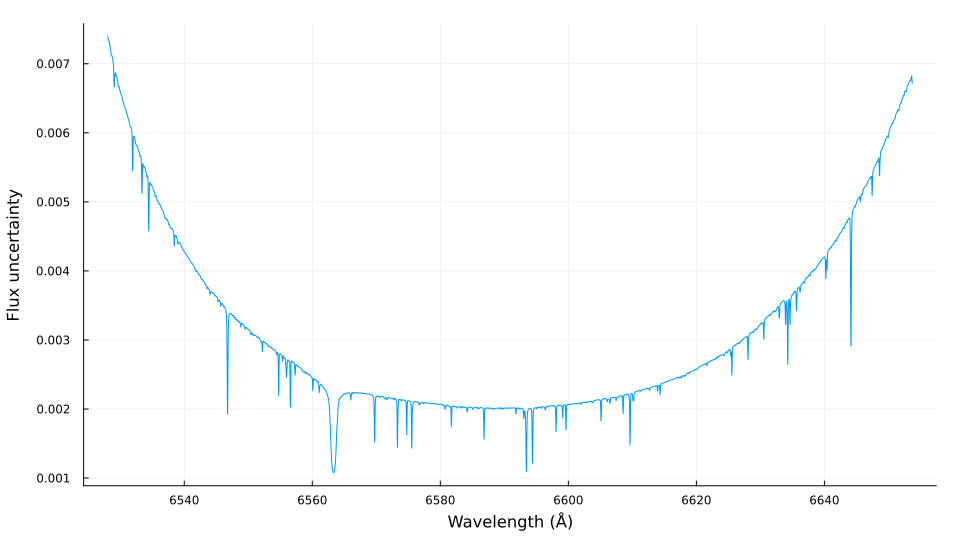

In [14]:
# measured_blaze = data.flux ./ data.var
# _, smooth_blazes = SSOF.calc_continuum(exp.(data.log_λ_obs), measured_blaze, data.var)
# smooth_blaze = vec(mean(smooth_blazes; dims=2))
# # filling in gaps
# lo = Inf
# for i in eachindex(smooth_blaze)
# 	if isfinite(smooth_blaze[i])
# 		if isfinite(lo)
# 			println("$lo, $i")
# 			smooth_blaze[lo:i] .= smooth_blaze[lo] .+ ((smooth_blaze[i]-smooth_blaze[lo]) * LinRange(0,1,i-lo+1))
# 			lo = Inf
# 		end
# 	elseif !isfinite(lo)
# 		lo = i-1
# 	end
# end
# using DataInterpolations
# blaze_function= DataInterpolations.LinearInterpolation(smooth_blaze, vec(mean(data.log_λ_obs; dims=2)))
# @save "examples/jld2/blaze.jld2" blaze_function
@load "jld2/blaze.jld2" blaze_function
var_total = flux_total_lsf ./ blaze_function.(log_λ_obs)

# scaling variance to have the desired SNR in the center
cp = Int(round(size(flux_total_lsf,1)/2))
snr_cp = median(flux_total_lsf[(cp-500):(cp+500),:] ./ sqrt.(var_total[(cp-500):(cp+500),:]))
var_total .*= (snr_cp / desired_max_snr)^2

# plotting the data uncertainties to be inserted into the first simulated spectra
plot_spectrum()
plot!(exp.(log_λ_obs[:, 1]), sqrt.(var_total[:, 1]); ylabel="Flux uncertainty", label="")

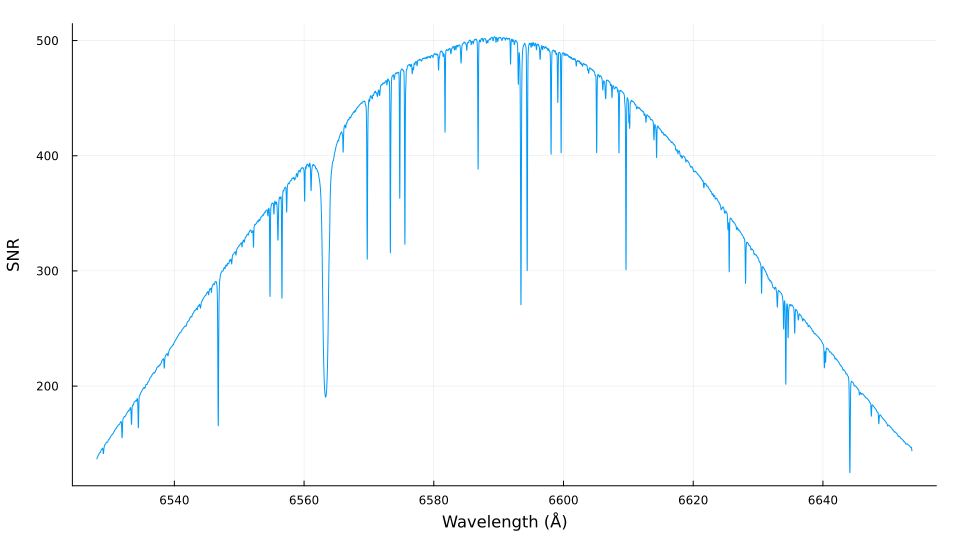

In [15]:
# plotting the SNR of the first simulated spectra
plot_spectrum()
plot!(exp.(log_λ_obs[:, 1]), flux_total_lsf[:, 1] ./ sqrt.(var_total[:, 1]); ylabel="SNR", label="")

#### Adding photon noise

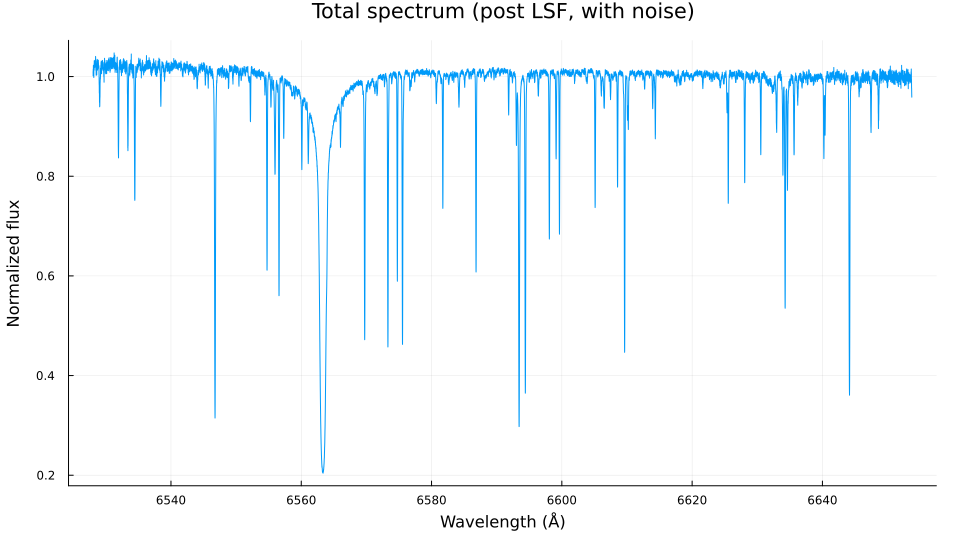

In [16]:
flux_noisy = flux_total_lsf .+ (randn(size(var_total)) .* sqrt.(var_total))
plot_spectrum()
plot!(exp.(log_λ_obs[:, 1]), flux_noisy[:, 1]; label="", ylabel="Normalized flux", title="Total spectrum (post LSF, with noise)")

#### Collecting everything nicely for SSOF

In [17]:
data_simulated = SSOF.LSFData(flux_noisy, var_total, copy(var_total), log_λ_obs, log_λ_stellar, lsf_simulated) 
SSOF.mask_bad_edges!(data_simulated);

## Analyzing the simulated data

### Getting an initial model

In [ ]:
# getting initial model
star = "26965"
instrument = "SSOF"
order = 81

n_comp = 2  # maximum amount of feature vectors to use for each portion of the model

model_new = SSOF.calculate_initial_model(data_simulated; 
	instrument=instrument, desired_order=order, star=star, times=times,
	max_n_tel=n_comp, max_n_star=n_comp, log_λ_gp_star=1/SSOF.SOAP_gp_params.λ,
	log_λ_gp_tel=5.134684755671457e-6,
	tel_log_λ=model.tel.log_λ, star_log_λ=model.star.log_λ, oversamp=false)

# setting up model workspace
mws = SSOF.ModelWorkspace(model_new, data_simulated);

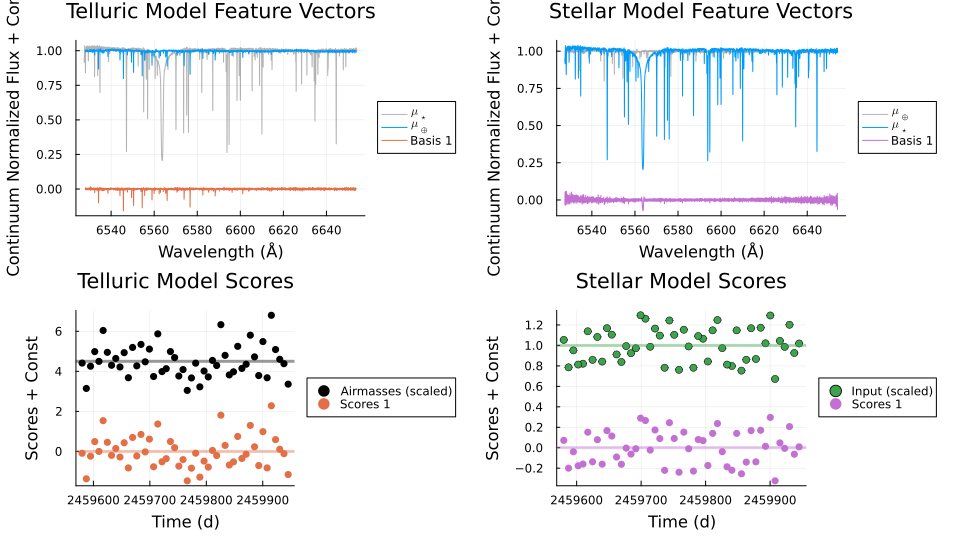

In [19]:
df_act = Dict([("Input", vec(model_scores_stellar)), ("Input_σ", zeros(length(model_scores_stellar)))])
plot_model(model_new, vec(model_scores_telluric), times; df_act=df_act, size=(960, 540));

### Fitting regularization

In [20]:
SSOF.fit_regularization!(mws)

ℓ:     713132.2145311851  ℓ_1/ℓ_0:       Inf
L2_Δ:  7.244885305504756e11  L2_Δ_1/L2_Δ_0: Inf

ℓ:     704839.6884657294  ℓ_2/ℓ_1:       0.9883716849463781
L2_Δ:  7.153097554278877e11  L2_Δ_2/L2_Δ_1: 0.9873306826325964

ℓ:     693174.7897266669  ℓ_3/ℓ_2:       0.983450281063976
L2_Δ:  4.656232620119895e11  L2_Δ_3/L2_Δ_2: 0.6509393426816339

ℓ:     684327.4846187937  ℓ_4/ℓ_3:       0.9872365451845676
L2_Δ:  3.335157665445495e11  L2_Δ_4/L2_Δ_3: 0.7162781453473896

ℓ:     678742.5836485807  ℓ_5/ℓ_4:       0.9918388474878748
L2_Δ:  2.61704316354985e11  L2_Δ_5/L2_Δ_4: 0.7846834920772111

ℓ:     673888.3138333329  ℓ_6/ℓ_5:       0.9928481431220159
L2_Δ:  1.897305319362503e11  L2_Δ_6/L2_Δ_5: 0.7249805222123012

ℓ:     671104.1893948771  ℓ_7/ℓ_6:       0.9958685669697719
L2_Δ:  2.1056343897605142e11  L2_Δ_7/L2_Δ_6: 1.1098026070300642

ℓ:     669187.2243118999  ℓ_8/ℓ_7:       0.9971435656142965
L2_Δ:  2.015478401593662e11  L2_Δ_8/L2_Δ_7: 0.9571834556819211

ℓ:     667556.4206532433  ℓ_9/ℓ_8:     

ℓ:     644574.2712963477  ℓ_76/ℓ_75:       0.9999005606057029
L2_Δ:  2.0008964216485292e8  L2_Δ_76/L2_Δ_75: 0.9641467636127826

ℓ:     644511.3010860423  ℓ_77/ℓ_76:       0.9999023072854293
L2_Δ:  1.9385562520917398e8  L2_Δ_77/L2_Δ_76: 0.9688438797319515

ℓ:     644448.5329897176  ℓ_78/ℓ_77:       0.9999026113332397
L2_Δ:  1.7907374404812387e8  L2_Δ_78/L2_Δ_77: 0.9237479895406688

ℓ:     644387.124325898  ℓ_79/ℓ_78:       0.9999047112986127
L2_Δ:  1.666138390096744e8  L2_Δ_79/L2_Δ_78: 0.9304202572818212

ℓ:     644327.6379473051  ℓ_80/ℓ_79:       0.9999076853395308
L2_Δ:  1.587426789324122e8  L2_Δ_80/L2_Δ_79: 0.9527580654521431

ℓ:     644269.0948957831  ℓ_81/ℓ_80:       0.9999091408654943
L2_Δ:  1.4924903692940477e8  L2_Δ_81/L2_Δ_80: 0.9401947726543689

ℓ:     644210.5858998881  ℓ_82/ℓ_81:       0.9999091854686829
L2_Δ:  1.3991787123182508e8  L2_Δ_82/L2_Δ_81: 0.9374792233869265

ℓ:     644153.0817840656  ℓ_83/ℓ_82:       0.9999107370833682
L2_Δ:  1.3517370216883972e8  L2_Δ_83/L2_Δ_82:

┌ Warning: weak local minimum 222067.6691535342 vs. 222067.67440499354
└ @ StellarSpectraObservationFitting C:\Users\Christian\Dropbox\GP_research\julia\StellarSpectraObservationFitting\src\regularization_functions.jl:115
┌ Warning: weak local minimum 221989.91245226708 vs. 221989.9220749281
└ @ StellarSpectraObservationFitting C:\Users\Christian\Dropbox\GP_research\julia\StellarSpectraObservationFitting\src\regularization_functions.jl:115
┌ Warning: weak local minimum 220821.77972476068 vs. 220821.83665251936
└ @ StellarSpectraObservationFitting C:\Users\Christian\Dropbox\GP_research\julia\StellarSpectraObservationFitting\src\regularization_functions.jl:115
┌ Warning: weak local minimum 220821.02912308375 vs. 220821.24635619507
└ @ StellarSpectraObservationFitting C:\Users\Christian\Dropbox\GP_research\julia\StellarSpectraObservationFitting\src\regularization_functions.jl:115


true

### Performing final fit

In [21]:
results = SSOF.improve_model!(mws; iter=500, verbose=true, careful_first_step=true, speed_up=false)

ℓ:     1.4715508725416637e6  ℓ_1/ℓ_0:       2.2876483930022546
L2_Δ:  8.891834234898433e11  L2_Δ_1/L2_Δ_0: 10579.152519011175

ℓ:     1.3401424043430756e6  ℓ_2/ℓ_1:       0.9107006963533518
L2_Δ:  6.896199918811279e11  L2_Δ_2/L2_Δ_1: 0.7755655061297992

ℓ:     1.209123702984102e6  ℓ_3/ℓ_2:       0.9022352393787603
L2_Δ:  5.01449299978841e11  L2_Δ_3/L2_Δ_2: 0.7271385775969172

ℓ:     1.1061934829319685e6  ℓ_4/ℓ_3:       0.914872051719685
L2_Δ:  3.6531426553297595e11  L2_Δ_4/L2_Δ_3: 0.7285168521491417

ℓ:     1.0338905284559766e6  ℓ_5/ℓ_4:       0.9346380578157514
L2_Δ:  2.7991697915780597e11  L2_Δ_5/L2_Δ_4: 0.7662361029055916

ℓ:     984904.6401254259  ℓ_6/ℓ_5:       0.9526198499915588
L2_Δ:  2.2917974402825146e11  L2_Δ_6/L2_Δ_5: 0.818741845234937

ℓ:     950537.5650186839  ℓ_7/ℓ_6:       0.9651061902781112
L2_Δ:  1.9725454853951572e11  L2_Δ_7/L2_Δ_6: 0.8606980052966624

ℓ:     924206.4632535873  ℓ_8/ℓ_7:       0.9722987257588509
L2_Δ:  1.741036473297897e11  L2_Δ_8/L2_Δ_7: 0.88263438596

ℓ:     662642.0773158998  ℓ_76/ℓ_75:       0.9996260720914667
L2_Δ:  6.011152859441382e8  L2_Δ_76/L2_Δ_75: 0.9669811447556279

ℓ:     662401.568510112  ℓ_77/ℓ_76:       0.9996370456781707
L2_Δ:  5.813025268374063e8  L2_Δ_77/L2_Δ_76: 0.9670400011944247

ℓ:     662168.2706004694  ℓ_78/ℓ_77:       0.9996477998834343
L2_Δ:  5.625108175761622e8  L2_Δ_78/L2_Δ_77: 0.9676730989567843

ℓ:     661941.8967906345  ℓ_79/ℓ_78:       0.9996581325021363
L2_Δ:  5.449223810829172e8  L2_Δ_79/L2_Δ_78: 0.9687322697738812

ℓ:     661722.0506080377  ℓ_80/ℓ_79:       0.9996678769184083
L2_Δ:  5.284265509696892e8  L2_Δ_80/L2_Δ_79: 0.9697281104871375

ℓ:     661508.2784792109  ℓ_81/ℓ_80:       0.9996769457378208
L2_Δ:  5.127338549986188e8  L2_Δ_81/L2_Δ_80: 0.9703029759911316

ℓ:     661300.1885993362  ℓ_82/ℓ_81:       0.999685431178045
L2_Δ:  4.978847550448657e8  L2_Δ_82/L2_Δ_81: 0.9710393612417244

ℓ:     661097.4580654446  ℓ_83/ℓ_82:       0.9996934364493061
L2_Δ:  4.8380106021983504e8  L2_Δ_83/L2_Δ_82: 0.971

ℓ:     653657.1034455814  ℓ_150/ℓ_149:       0.99990133513148
L2_Δ:  1.538849430836849e8  L2_Δ_150/L2_Δ_149: 0.9878419004184105

ℓ:     653593.3756430193  ℓ_151/ℓ_150:       0.9999025057599372
L2_Δ:  1.5202781813619614e8  L2_Δ_151/L2_Δ_150: 0.9879317306146137

ℓ:     653530.3961141247  ℓ_152/ℓ_151:       0.9999036411150393
L2_Δ:  1.5020558528064495e8  L2_Δ_152/L2_Δ_151: 0.9880138195897891

ℓ:     653468.1506958837  ℓ_153/ℓ_152:       0.9999047551290481
L2_Δ:  1.484208671081397e8  L2_Δ_153/L2_Δ_152: 0.9881181637209383

ℓ:     653406.6203387235  ℓ_154/ℓ_153:       0.9999058403120418
L2_Δ:  1.4666468039330637e8  L2_Δ_154/L2_Δ_153: 0.9881675215281301

ℓ:     653345.7911455065  ℓ_155/ℓ_154:       0.9999069045349044
L2_Δ:  1.4494410504036528e8  L2_Δ_155/L2_Δ_154: 0.9882686455366958

ℓ:     653285.6525081805  ℓ_156/ℓ_155:       0.9999079528204802
L2_Δ:  1.432554816610705e8  L2_Δ_156/L2_Δ_155: 0.988349830585904

ℓ:     653226.1886585446  ℓ_157/ℓ_156:       0.9999089772607012
L2_Δ:  1.415933865

ℓ:     650353.6231491953  ℓ_223/ℓ_222:       0.9999499681319514
L2_Δ:  7.469229338236073e7  L2_Δ_223/L2_Δ_222: 0.9918462855994856

ℓ:     650321.32421793  ℓ_224/ℓ_223:       0.9999503363553063
L2_Δ:  7.409069991313699e7  L2_Δ_224/L2_Δ_223: 0.9919457089616449

ℓ:     650289.2607058994  ℓ_225/ℓ_224:       0.9999506958931893
L2_Δ:  7.349366328268157e7  L2_Δ_225/L2_Δ_224: 0.9919418141392189

ℓ:     650257.4334464824  ℓ_226/ℓ_225:       0.9999510567660574
L2_Δ:  7.290576826346728e7  L2_Δ_226/L2_Δ_225: 0.9920007386629641

ℓ:     650225.837579825  ℓ_227/ℓ_226:       0.9999514102184269
L2_Δ:  7.232641761574236e7  L2_Δ_227/L2_Δ_226: 0.9920534319639666

ℓ:     650194.4731566336  ℓ_228/ℓ_227:       0.9999517638005464
L2_Δ:  7.175308146542503e7  L2_Δ_228/L2_Δ_227: 0.9920729358757493

ℓ:     650163.3353933715  ℓ_229/ℓ_228:       0.9999521100769884
L2_Δ:  7.119117067937762e7  L2_Δ_229/L2_Δ_228: 0.9921688271141613

ℓ:     650132.4194111964  ℓ_230/ℓ_229:       0.9999524488993886
L2_Δ:  7.0633331086898

L2_Δ:  4.483113719406086e7  L2_Δ_296/L2_Δ_295: 0.9939400514805432

ℓ:     648457.4469749344  ℓ_297/ℓ_296:       0.9999684330337788
L2_Δ:  4.456109313976317e7  L2_Δ_297/L2_Δ_296: 0.993976417481253

ℓ:     648437.0818990958  ℓ_298/ℓ_297:       0.9999685945840646
L2_Δ:  4.429250109671719e7  L2_Δ_298/L2_Δ_297: 0.9939724987849029

ℓ:     648416.8307523401  ℓ_299/ℓ_298:       0.9999687692957097
L2_Δ:  4.403657358485845e7  L2_Δ_299/L2_Δ_298: 0.9942218771683292

ℓ:     648396.6799312031  ℓ_300/ℓ_299:       0.9999689230442806
L2_Δ:  4.376783163508751e7  L2_Δ_300/L2_Δ_299: 0.9938973010864919

ℓ:     648376.6356069576  ℓ_301/ℓ_300:       0.9999690863249829
L2_Δ:  4.350707864111228e7  L2_Δ_301/L2_Δ_300: 0.9940423597826539

ℓ:     648356.6993700971  ℓ_302/ℓ_301:       0.999969252073925
L2_Δ:  4.325623824628154e7  L2_Δ_302/L2_Δ_301: 0.9942344923477876

ℓ:     648336.8682486265  ℓ_303/ℓ_302:       0.9999694132543244
L2_Δ:  4.3002765398655444e7  L2_Δ_303/L2_Δ_302: 0.9941402013234961

ℓ:     648317.139

ℓ:     647205.5733101622  ℓ_370/ℓ_369:       0.9999776149670966
L2_Δ:  3.0097174376185976e7  L2_Δ_370/L2_Δ_369: 0.9952333415503563

ℓ:     647191.144323044  ℓ_371/ℓ_370:       0.9999777057125074
L2_Δ:  2.9953520907800093e7  L2_Δ_371/L2_Δ_370: 0.9952270114599348

ℓ:     647176.7798585071  ℓ_372/ℓ_371:       0.9999778049117901
L2_Δ:  2.9819287348790698e7  L2_Δ_372/L2_Δ_371: 0.9955186049939645

ℓ:     647162.4685487074  ℓ_373/ℓ_372:       0.9999778865524149
L2_Δ:  2.966884458112747e7  L2_Δ_373/L2_Δ_372: 0.9949548503321516

ℓ:     647148.2232833033  ℓ_374/ℓ_373:       0.9999779881156643
L2_Δ:  2.953437145371442e7  L2_Δ_374/L2_Δ_373: 0.9954675306938447

ℓ:     647134.0367989896  ℓ_375/ℓ_374:       0.9999780784620844
L2_Δ:  2.9392885678022042e7  L2_Δ_375/L2_Δ_374: 0.9952094536389877

ℓ:     647119.9074799716  ℓ_376/ℓ_375:       0.9999781663176182
L2_Δ:  2.9250989321158443e7  L2_Δ_376/L2_Δ_375: 0.9951724251093285

ℓ:     647105.8382255189  ℓ_377/ℓ_376:       0.9999782586591911
L2_Δ:  2.911685

ℓ:     646287.2231397852  ℓ_443/ℓ_442:       0.9999829932455899
L2_Δ:  2.1977144133695062e7  L2_Δ_443/L2_Δ_442: 0.9963862475338676

ℓ:     646276.2655909205  ℓ_444/ℓ_443:       0.9999830453883778
L2_Δ:  2.1883037054781463e7  L2_Δ_444/L2_Δ_443: 0.9957179568764207

ℓ:     646265.3477065266  ℓ_445/ℓ_444:       0.999983106474777
L2_Δ:  2.1805739011972535e7  L2_Δ_445/L2_Δ_444: 0.9964676729918511

ℓ:     646254.4599352918  ℓ_446/ℓ_445:       0.9999831527850387
L2_Δ:  2.1717374720751643e7  L2_Δ_446/L2_Δ_445: 0.9959476589547194

ℓ:     646243.6155535405  ℓ_447/ℓ_446:       0.999983219641142
L2_Δ:  2.1637529046247736e7  L2_Δ_447/L2_Δ_446: 0.9963234195877455

ℓ:     646232.8037422068  ℓ_448/ℓ_447:       0.9999832697591534
L2_Δ:  2.154998088273539e7  L2_Δ_448/L2_Δ_447: 0.9959538742466748

ℓ:     646222.0301862882  ℓ_449/ℓ_448:       0.9999833286768233
L2_Δ:  2.147111962949456e7  L2_Δ_449/L2_Δ_448: 0.9963405418468835

ℓ:     646211.2915767855  ℓ_450/ℓ_449:       0.9999833824769181
L2_Δ:  2.1385005

ℓ:     634636.0913508963
L∞(∇): 4.448458527894772e-5


Iter:  35
Time:  12.825999975204468 s
ℓ:     634636.0913508962
L∞(∇): 9.328834317479107e-6


Iter:  36
Time:  13.050999879837036 s
ℓ:     634636.0913508964
L∞(∇): 4.272310047959138e-7


Iter:  37
Time:  13.38699984550476 s
ℓ:     634636.0913508964
L∞(∇): 1.823918782534184e-7


Iter:  38
Time:  13.704999923706055 s
ℓ:     634636.0913508964
L∞(∇): 7.338199736750539e-8



 * Status: success

 * Candidate solution
    Final objective value:     6.346361e+05

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 2.56e-12 ≰ 0.0e+00
    |x - x'|/|x'|          = 8.98e-13 ≰ 0.0e+00
    |f(x) - f(x')|         = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 0.00e+00 ≤ 0.0e+00
    |g(x)|                 = 7.34e-08 ≰ 1.0e-08

 * Work counters
    Seconds run:   14  (vs limit Inf)
    Iterations:    38
    f(x) calls:    120
    ∇f(x) calls:   120


### Getting error bars

In [22]:
rvs, rvs_σ, tel_s_σ, star_s_σ = SSOF.estimate_σ_curvature(mws)
# rvs, rvs_σ, tel_s_σ, star_s_σ = SSOF.estimate_σ_bootstrap(mws)

done with 10/50 rv_σ estimates
done with 20/50 rv_σ estimates
done with 30/50 rv_σ estimates
done with 40/50 rv_σ estimates
done with 50/50 rv_σ estimates
done with 10/50 tel_s_σ estimates
done with 20/50 tel_s_σ estimates
done with 30/50 tel_s_σ estimates
done with 40/50 tel_s_σ estimates
done with 50/50 tel_s_σ estimates
done with 10/50 star_s_σ estimates
done with 20/50 star_s_σ estimates
done with 30/50 star_s_σ estimates
done with 40/50 star_s_σ estimates
done with 50/50 star_s_σ estimates


([0.2332578987707747, -2.350550642965102, -0.6808715357562956, -0.241396355892574, -1.5881402951502046, -0.5972659693357063, -0.92860403032123, -1.2945408968276286, 0.3926332886854852, -1.4547118960329626  …  0.06932281858378629, -1.1909579019493366, -0.9776857203408199, -0.5245435248964196, -1.2470118034856967, -1.1946120865402767, 0.20200032776474047, 1.4587870090995005, -2.3496157508992526, -0.5745561199584155], [0.9776417243063042, 0.9775726867947879, 0.9752017542984027, 0.977451228187152, 0.9762934721231649, 0.9801732398166271, 0.974385565622924, 0.9771669218904872, 0.9770278951887378, 0.9815004874178169  …  0.976418654944033, 0.979235906443916, 0.9773774599003192, 0.979733304056585, 0.9772282318559007, 0.9793615687572429, 0.97958796044892, 0.9785305104718185, 0.9796010083315141, 0.9768829791157245], [0.0030052937068701696 0.003180300689962518 … 0.002968972226449574 0.0031912914929220684], [0.0049838666319713025 0.005401895067740456 … 0.0042004110109678805 0.00497821881785779])

### Some inspection plots

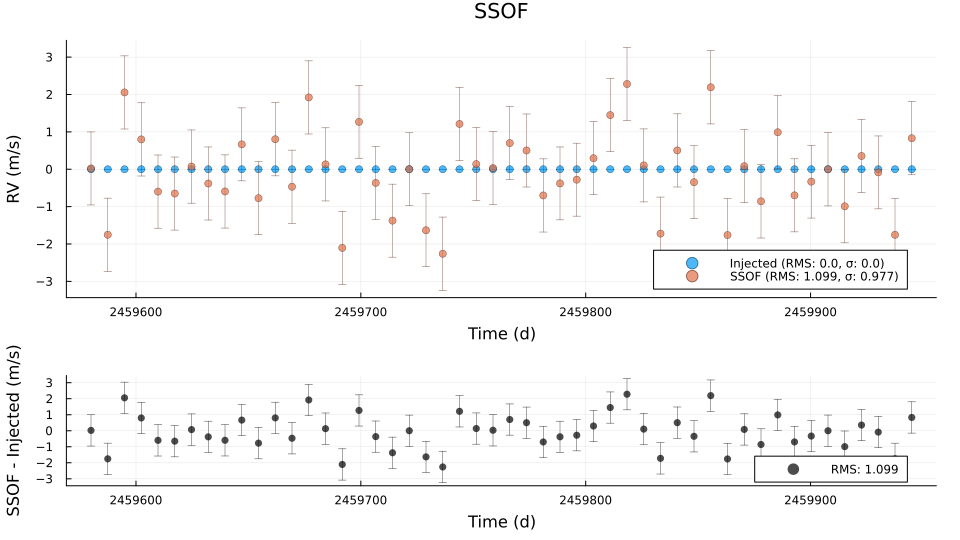

In [23]:
# how do our RV estimates look
plot_model_rvs(times, rvs, rvs_σ, times, injected_rvs, zeros(length(times)); title="SSOF", inst_str="Injected");

In [24]:
# how well did the model fit the data
plt = status_plot(mws; display_plot=false);

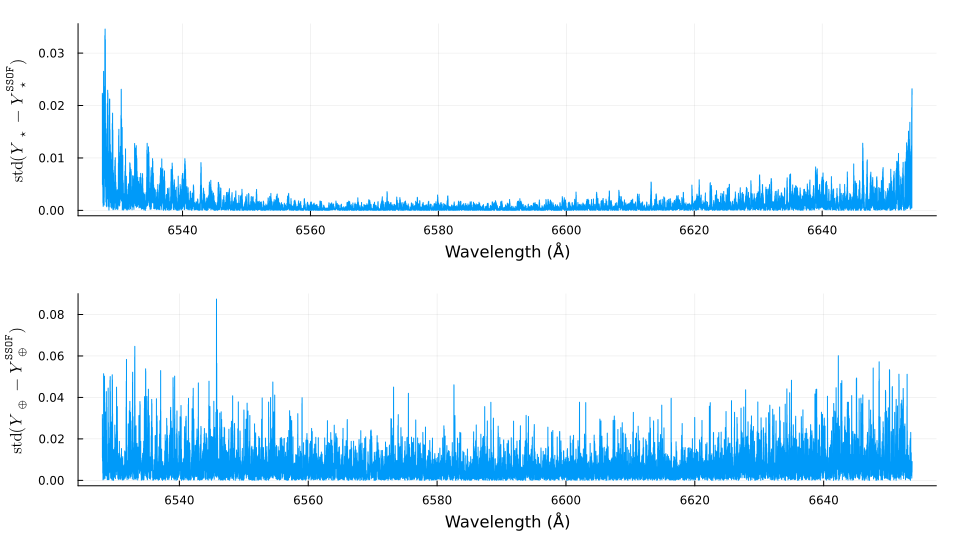

In [25]:
# how close is each model to recreating the noiseless version used to simulate the data
plt = _plot(; layout=grid(2, 1, heights=[0.5, 0.5]), size=(960, 540));
plot!(plt[1], model.star.λ, vec(std(_flux_stellar - model_new.star.lm(); dims=2)); label="", xlabel = "Wavelength (Å)", ylabel = L"\textrm{std}(Y_\star - Y_\star^{\texttt{SSOF}})");
plot!(plt[2], model.tel.λ, vec(std(flux_tellurics - model_new.tel.lm(); dims=2)); label="", xlabel = "Wavelength (Å)", ylabel = L"\textrm{std}(Y_\oplus - Y_\oplus^{\texttt{SSOF}})")

In [26]:
# how close is each template and feature vector to the source models
function compare_model_component(source, model, stellar::Bool; kwargs...)
	plt = _plot(; layout = grid(2, 1, heights=[0.75, 0.25]), kwargs...)
	stellar ? plot_f = plot_stellar_with_lsf! : plot_f = plot_telluric_with_lsf!
	plot_f(plt[1], model_new, source; d=data_simulated, label="Source", color=plt_colors[1], alpha=0.7, legend=:outerright, ylabel = "Continuum Normalized Flux + Const")
	plot_f(plt[1], model_new, model .- (maximum(model) - minimum(source)); d=data_simulated, label="Model", color=plt_colors[2], alpha=0.7)
	plot_f(plt[2], model_new, source .- model; d=data_simulated, label="", color=base_color, alpha=0.7, legend=:outerright, xlabel = "Wavelength (Å)", ylabel = "Residual", title="")
	return plt
end

# how close are the measuresd scores to the source scores
normalized(x) = (x .- mean(x)) / std(x)
function compare_model_score(source, model; kwargs...)
	plt = _plot(; layout = grid(2, 1, heights=[0.75, 0.25]), kwargs...)
	s = normalized(source)
	m = normalized(model)
	scatter!(plt[1], times, s; label="Source", alpha=0.7, legend=:outerright, ylabel = "Normalized Scores")
	scatter!(plt[1], times, m .- (maximum(m) - minimum(s)); label="Model", color=plt_colors[2], alpha=0.7)
	scatter!(plt[2], times, s .- m; label="", color=base_color, xlabel = "Wavelength (Å)", ylabel = "Residual", title="", legend=:outerright)
	return plt
end


compare_model_score (generic function with 1 method)

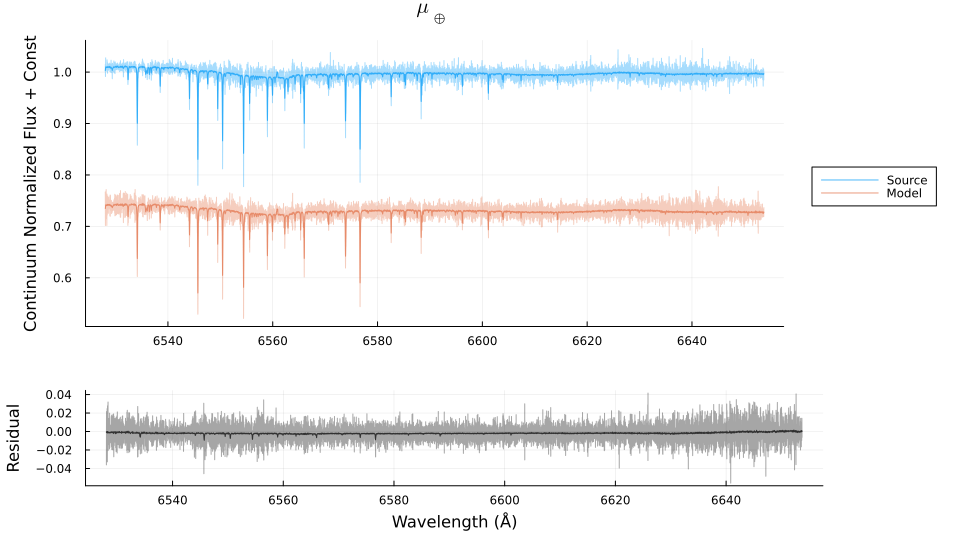

In [27]:
compare_model_component(model.tel.lm.μ,  model_new.tel.lm.μ, false; title=L"\mu_\oplus")

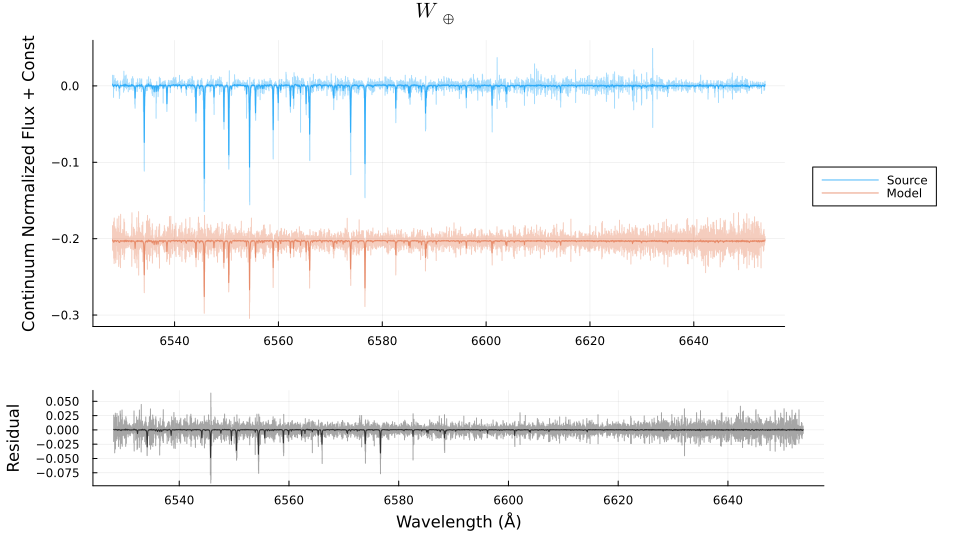

In [28]:
compare_model_component(model.tel.lm.M[:, 1] ./ norm(model.tel.lm.M[:, 1]),  model_new.tel.lm.M[:, 1] ./ norm(model_new.tel.lm.M[:, 1]), false; title=L"W_\oplus")

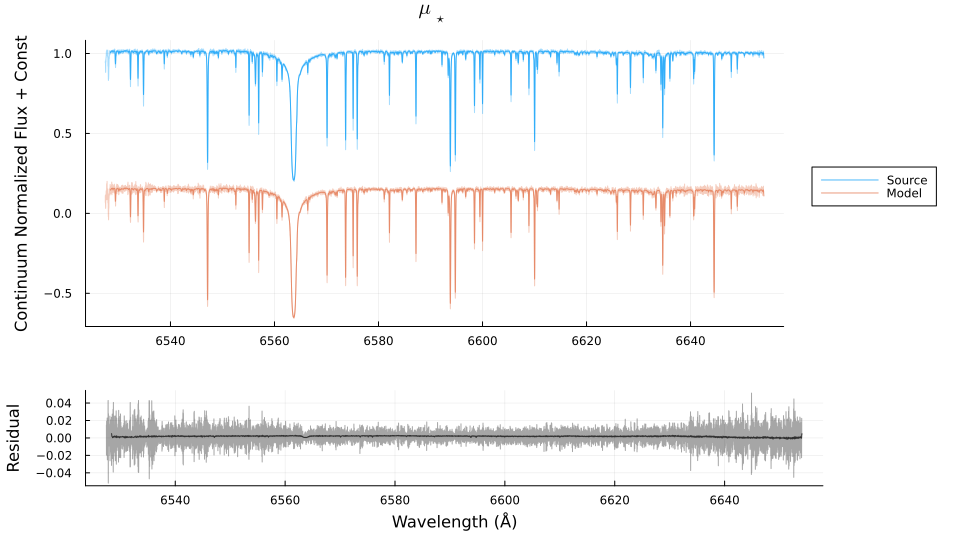

In [29]:
compare_model_component(model.star.lm.μ,  model_new.star.lm.μ, true; title=L"\mu_\star")

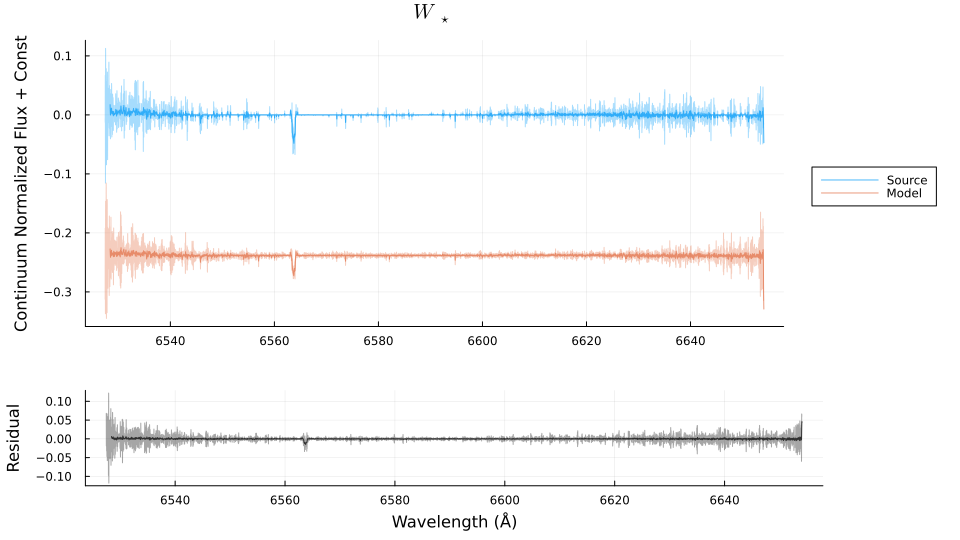

In [30]:
compare_model_component(model.star.lm.M[:, 1]./ norm(model.star.lm.M[:, 1]),  model_new.star.lm.M[:, 1]./ norm(model_new.star.lm.M[:, 1]), true; title=L"W_\star")

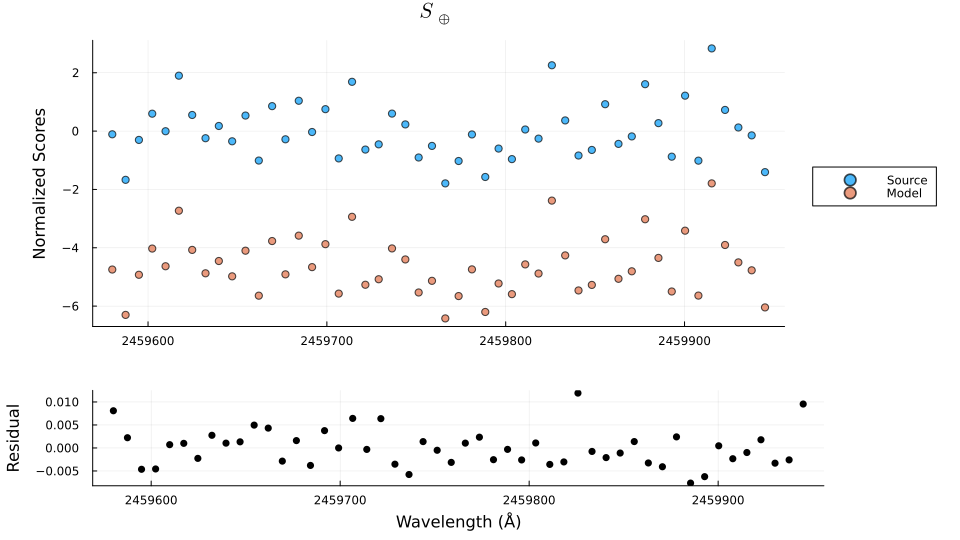

In [31]:
compare_model_score(model_scores_telluric', model_new.tel.lm.s'; title=L"S_\oplus")

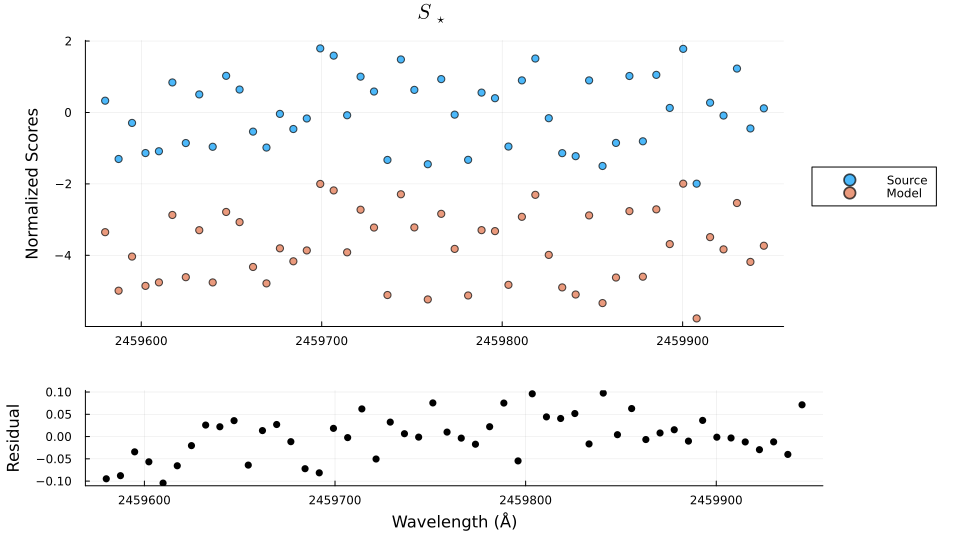

In [32]:
compare_model_score(model_scores_stellar', model_new.star.lm.s'; title=L"S_\star")